# MCTS in GridWorld

In [2]:
using DMUStudent.HW3
using DMUStudent
using POMDPs
import POMDPModelTools: render
using POMDPPolicies

You can create a randomly sampled 100 x 100 grid world with `DenseGridWorld()`:

In [3]:
m = DenseGridWorld();

You can look different parts of the dense grid world with functions from the [explicit](https://juliapomdp.github.io/POMDPs.jl/stable/api/#explicit_api-1) and [common](https://juliapomdp.github.io/POMDPs.jl/stable/api/#common_api-1) section of the POMDPs.jl API

In [4]:
display(actions(m))

(:up, :down, :left, :right)

In [5]:
statetype(m) == GWPos

true

In [6]:
display(transition(m, GWPos(1,1), :left))

                     SparseCat distribution
            ┌                                        ┐ 
     [1, 1] ┤■■■■■■■■■■■■■■■■■■■■ 0.9333333333333333   
     [1, 2] ┤■ 0.033333333333333326                    
   [-1, -1] ┤ 0.0                                      
   [-1, -1] ┤ 0.0                                      
     [2, 1] ┤■ 0.033333333333333326                    
            └                                        ┘ 

You can visualize a grid world, but only up to 60x60 for now. (If you want to help refactor it so that it can handle 100x100, let me know!!)

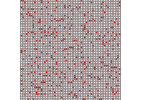

In [7]:
small = DenseGridWorld(size=(60,60))
render(small, (s=GWPos(30,30),)) # the orange circle represents the state (30,30)

You can evaluate either a `POMDPs.Policy` or a `POMDPs.Solver`

In [8]:
heuristic = FunctionPolicy(
    function pi(s) # this function represents a policy
        return :right # always go right
    end
);

In [9]:
# evaluate(heuristic, "hw3")

In [10]:
# evaluate(RandomSolver(), "hw3")

You may wish to use the MCTS package to solve this problem. Check the `MCTSSolver` docstring to see what tuning options are available.

In [11]:
using MCTS
solver = MCTSSolver(
    #=
    You probably want to use the max_time option because of the
    0.05 s limit on planning time. max_time only controls the
    iteration portion of the planning and there are a few other
    calculations, so it must be set to a little less than the
    limit
    =#
    max_time = 0.04,
    enable_tree_vis=true, # you may want to disable for max performance
);

# the solver is what you want to submit to be evaluated.
# it is commented out here because it will take several minutes

# evaluate(solver, "hw3")

In [12]:
planner = solve(solver, m);

# Tree Visualization

You can view a tree created at a certain state as follows:

In [13]:
using D3Trees
a, info = action_info(planner, convert(statetype(m), GWPos(28,28)))
D3Tree(info[:tree], init_expand=2)

[28, 28]
N:    363

├──                       up
│  Q: -39.95
│  N:      1

│  └──                 [28, 29]
│     N:     25

│     ├──                       up
│     │  Q:  -5.65
│     │  N:      1
 (1 children)
│     ├──                     down
│     │  Q:  -2.82
│     │  N:     12
 (2 children)
│     ├──                     left
│     │  Q:  -6.30
│     │  N:      1
 (1 children)
│     └──                    right
│        Q:  -3.83
│        N:     11
 (1 children)
├──                     down
│  Q: -43.87
│  N:      1

│  └──                 [28, 27]
│     N:     14

│     ├──                       up
│     │  Q:  -5.53
│     │  N:      1
 (1 children)
│     ├──                     down
│     │  Q:  -9.80
│     │  N:      5
 (1 children)
│     ├──                     left
│     │  Q: -10.97
│     │  N:      7
 (2 children)
│     └──                    right
│        Q:  -6.63
│        N:      1
 (1 children)
├──                     left
│  Q:  -6.92
│  N:    358

│  ├──                 [27, 28]
│  │  N:    328

│  │  ├──                       up
│  │  │  Q: -42.96
│  │  │  N:      1
 (1 children)
│  │  ├──                     down
│  │  │  Q: -10.12
│  │  │  N:      1
 (1 children)
│  │  ├──                     left
│  │  │  Q: -50.83
│  │  │  N:      1
 (1 children)
│  │  └──                    right
│  │     Q:  -5.88
│  │     N:    325
 (4 children)
│  ├──                 [28, 27]
│  │  N:     14

│  │  ├──                       up
│  │  │  Q:  -5.53
│  │  │  N:      1
 (1 children)
│  │  ├──                     down
│  │  │  Q:  -9.80
│  │  │  N:      5
 (1 children)
│  │  ├──                     left
│  │  │  Q: -10.97
│  │  │  N:      7
 (2 children)
│  │  └──                    right
│  │     Q:  -6.63
│  │     N:      1
 (1 children)
│  ├──                 [28, 29]
│  │  N:     25

│  │  ├──                       up
│  │  │  Q:  -5.65
│  │  │  N:      1
 (1 children)
│  │  ├──                     down
│  │  │  Q:  -2.82
│  │  │  N:     12
 (2 children)
│  │  ├──                     left
│  │  │  Q:  -6.30
│  │  │  N:      1
 (1 children)
│  │  └──                    right
│  │     Q:  -3.83
│  │     N:     11
 (1 children)
│  └──                 [29, 28]
│     N:     20

│     ├──                       up
│     │  Q:  -4.49
│     │  N:      7
 (1 children)
│     ├──                     down
│     │  Q: -90.96
│     │  N:      1
 (1 children)
│     ├──                     left
│     │  Q: -14.64
│     │  N:      7
 (2 children)
│     └──                    right
│        Q: -17.32
│        N:      5
 (1 children)
└──                    right
   Q: -33.03
   N:      3

   └──                 [29, 28]
      N:     20

      ├──                       up
      │  Q:  -4.49
      │  N:      7
 (1 children)
      ├──                     down
      │  Q: -90.96
      │  N:      1
 (1 children)
      ├──                     left
      │  Q: -14.64
      │  N:      7
 (2 children)
      └──                    right
         Q: -17.32
         N:      5
 (1 children)

# Value Estimate Visualization

You can also view what the tree thinks the value is at each state like this:

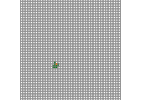

In [15]:
small_planner = solve(solver, small)
s = GWPos(22,22)
a, info = action_info(small_planner, s)

function val(s)
    tree = info[:tree]
    sid = get(tree.state_map, s, nothing)
    if isnothing(sid)
        return 0.0
    else
        return maximum(tree.q[c] for c in tree.child_ids[sid])
    end
end
render(small, (s=s,), color=val)

# Simulation

Running a simulation can be accomplished with the following code (copied from [the POMDPs.jl docs](https://juliapomdp.github.io/POMDPs.jl/stable/simulation/#MDP-Simulation-1))

In [34]:
let # creates a new scope so that r_total and d don't have to be global
    s = initialstate(m, rng)
    r_total = 0.0
    d = 1.0
    while !isterminal(m, s)
        a = action(planner, s)
        s, r = gen(DDNOut(:sp,:r), m, s, a, rng)
        r_total += d*r
        d *= discount(m)
    end
    @show r_total
end

r_total = -65.58986650246091


-65.58986650246091

# Evaluation Code

The following code is equivalent to the evaluation script (with the timing removed).

Note that `stepthrough`, from the [POMDPSimulators package](https://github.com/JuliaPOMDP/POMDPSimulators.jl) is what runs the actual simulation.

In [ ]:
using Random
using ProgressMeter
using DiscreteValueIteration
using POMDPSimulators

let # creates a new scope so that regret doesn't have to be global
    rng = MersenneTwister(rand(RandomDevice(), UInt32))

    N = 100
    nsteps = 0
    regret = 0.0
    @showprogress for i in 1:N
        m = rand(rng, DenseGridWorld)
        vip = solve(SparseValueIterationSolver(), m)

        if solver isa Policy
            p = solver
        else
            p = solve(solver, m)
        end

        for (s, a) in stepthrough(m, p, "s, a", rng=rng, max_steps=50)
            v = value(vip, s)
            q = value(vip, s, a)
            regret += v-q
        end
    end
    @show score = 100.0 - regret/N
end

Progress:  37%|███████████████▏                         |  ETA: 0:00:22